# Stock market data prediction

As of December 2022,this dataset seems to be the most complete and the most up-to-date.  It contains daily prices and volumes for all stocks listed on NYSE, S&P500, or NASDAQ and it gets updated on a weekly basis.

**Data pre processing and training testing done**

# Import Python Packages

In [1]:
!pip install  xelatex



ERROR: Could not find a version that satisfies the requirement xelatex (from versions: none)
ERROR: No matching distribution found for xelatex


In [2]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn import linear_model
from sklearn import svm
import pandas as pd
import time
from datetime import datetime
from itertools import cycle
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly_express as px
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
todays_date = datetime.fromtimestamp(time.time()).strftime("%Y-%m-%d")

def plot_stock_data(data,title):
    '''function for plotting stock data'''
    plot = px.line(data, 
                        x="Date", 
                        y=["Close"], 
                        hover_name="Date",
                        line_shape="linear",
                        title=title) 
    return plot

In [3]:
facebook = pd.read_csv('META.csv')
cisco = pd.read_csv('CSCO.csv')
apple = pd.read_csv('archive/stock_market_data/nasdaq/csv/AAPL.csv')
netflix = pd.read_csv('archive/stock_market_data/nasdaq/csv/NFLX.csv')
google = pd.read_csv('archive/stock_market_data/sp500/csv/GOOG.csv')
microsoft = pd.read_csv('archive/stock_market_data/nasdaq/csv/MSFT.csv')
amazon = pd.read_csv('archive/stock_market_data/nasdaq/csv/AMZN.csv')
nvidia = pd.read_csv('archive/stock_market_data/nasdaq/csv/NVDA.csv')
print('Data from',todays_date)
print('Preview of FB csv:')
cisco.tail(-5)
cisco.head()

Data from 2023-04-17
Preview of FB csv:


,Date,Open,High,Low,Close,Adj Close,Volume
0,1990-03-01,0.0,0.081597,0.079861,0.079861,0.056712,28425600
1,1990-03-02,0.0,0.081597,0.079861,0.080729,0.057328,8438400
2,1990-03-05,0.0,0.081597,0.079861,0.079861,0.056712,2419200
3,1990-03-06,0.0,0.081597,0.078993,0.079861,0.056712,23904000
4,1990-03-07,0.0,0.079861,0.077257,0.078125,0.055479,18172800


# **Loading the Stock Market Data into your Notebook**

In [4]:
# Set the date column as the index
cisco.set_index('Date')

# Calculate the daily return values
returns = cisco['Close'].pct_change()

# Add the return values to the dataframe as a new column
cisco['return'] = returns


In [5]:
facebook.shape
facebook.head(-5)

,Date,Open,High,Low,Close,Adj Close,Volume
0,2012-06-01,28.889999,29.150000,27.389999,27.719999,27.719999,41855500
1,2012-06-04,27.200001,27.650000,26.440001,26.900000,26.900000,35230300
2,2012-06-05,26.700001,27.760000,25.750000,25.870001,25.870001,42473400
3,2012-06-06,26.070000,27.170000,25.520000,26.809999,26.809999,61489200
4,2012-06-07,27.000000,27.350000,26.150000,26.309999,26.309999,26159500
...,...,...,...,...,...,...,...
2632,2022-11-15,116.070000,118.739998,114.410004,117.080002,117.080002,50670500
2633,2022-11-16,114.500000,116.080002,112.660004,113.230003,113.230003,33287800
2634,2022-11-17,110.410004,112.330002,109.800003,111.449997,111.449997,35093800
2635,2022-11-18,113.800003,114.320000,110.620003,112.050003,112.050003,33340900


In [6]:
cisco.describe()

,Open,High,Low,Close,Adj Close,Volume,return
count,8259.000000,8259.000000,8259.000000,8259.000000,8259.000000,8.259000e+03,8258.000000
mean,22.747206,23.041241,22.443831,22.744162,18.132627,5.375810e+07,0.001099
std,16.354063,16.563419,16.130476,16.350825,14.590284,4.004575e+07,0.025395
min,0.000000,0.072917,0.068576,0.071181,0.050548,8.064000e+05,-0.198276
25%,11.261667,11.576459,11.005209,11.250000,7.988962,2.806605e+07,-0.010622
50%,20.940001,21.180000,20.718750,20.950001,15.066724,4.622980e+07,0.000601
75%,30.100000,30.360001,29.859688,30.100000,23.145421,6.590420e+07,0.012605
max,81.437500,82.000000,79.062500,80.062500,62.013481,8.067330e+08,0.243884


# Checking for null values and removing it

In [7]:
cisco.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
return       1
dtype: int64

In [8]:
for col,value in  cisco.items():
    if col !='Date':
         cisco[col]= cisco[col].fillna( cisco[col].mean())

# Removing unique values

In [9]:
for column in  cisco.columns:
    print(column, cisco[column].nunique())

Date 8259
Open 4201
High 4197
Low 4207
Close 4360
Adj Close 5657
Volume 8186
return 7931


# Removing duplicated values

In [10]:
cisco.duplicated().sum()

0

In [11]:
cisco.isna().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
return       0
dtype: int64

# Plot the data

In [12]:
 cisco['Date'] = pd.to_datetime( cisco['Date'], format='%Y-%m-%d')

y_2014 =  cisco.loc[( cisco['Date'] >= '1990-03-01')
                     & ( cisco['Date'] < '2022-12-29')]

y_2014.drop(y_2014[['Adj Close','Volume']],axis=1)

,Date,Open,High,Low,Close,return
0,1990-03-01,0.000000,0.081597,0.079861,0.079861,0.001099
1,1990-03-02,0.000000,0.081597,0.079861,0.080729,0.010869
2,1990-03-05,0.000000,0.081597,0.079861,0.079861,-0.010752
3,1990-03-06,0.000000,0.081597,0.078993,0.079861,0.000000
4,1990-03-07,0.000000,0.079861,0.077257,0.078125,-0.021738
...,...,...,...,...,...,...
8254,2022-12-02,49.230000,49.840000,48.919998,49.700001,-0.005403
8255,2022-12-05,49.549999,49.639999,49.169998,49.330002,-0.007445
8256,2022-12-06,49.439999,49.439999,48.259998,48.590000,-0.015001
8257,2022-12-07,48.400002,48.549999,48.060001,48.180000,-0.008438


In [13]:
monthvise= y_2014.groupby(y_2014['Date'].dt.strftime('%B'))[['Open','Close']].mean()
new_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 
             'September', 'October', 'November', 'December']
monthvise = monthvise.reindex(new_order, axis=0)
monthvise

,Open,Close
Date,,
January,22.851269,22.858753
February,23.101830,23.083073
March,22.549102,22.569675
April,22.443395,22.413317
May,22.457925,22.459498
June,22.710319,22.705106
July,22.779515,22.792730
August,22.994987,22.989430
September,22.814540,22.795672


In [14]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=monthvise.index,
    y=monthvise['Open'],
    name='Stock Open Price',
    marker_color='crimson'
))
fig.add_trace(go.Bar(
    x=monthvise.index,
    y=monthvise['Close'],
    name='Stock Close Price',
    marker_color='lightsalmon'
))

fig.update_layout(barmode='group', xaxis_tickangle=-90, 
                  title='Monthwise comparision between Stock open and close price')
fig.show()

In [15]:
names = cycle(['Stock Open Price','Stock Close Price','Stock High Price','Stock Low Price'])

fig = px.line(y_2014, x=y_2014.Date, y=[y_2014['Open'], y_2014['Close'], 
                                          y_2014['High'], y_2014['Low']],
             labels={'Date': 'Date','value':'Stock value'})
fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

In [16]:
plot_stock_data(cisco[:],'Cisco')

In [17]:
plot_stock_data(facebook[:],'Facebook')

In [18]:
plot_stock_data(apple[:],'Apple')

In [19]:
plot_stock_data(netflix[:],'Netflix')

In [20]:
plot_stock_data(google[:],'Google')


In [21]:
plot_stock_data(microsoft[:],'Microsoft')

In [22]:
plot_stock_data(amazon[:],'Amazon')

In [23]:
plot_stock_data(nvidia[:],'NVIDIA')

# Checking outliers of the data

In [24]:
# list of numerical variables
numerical_features = [feature for feature in cisco.columns if ((cisco[feature].dtypes != 'O') & (feature not in ['Open']))]
print('Number of numerical variables: ', len(numerical_features))

# visualise the numerical variables
cisco[numerical_features].head()



discrete_feature=[feature for feature in numerical_features if len(cisco[feature].unique())<25]
print("Discrete Variables Count: {}".format(len(discrete_feature)))

continuous_features=[feature for feature in numerical_features if feature not in discrete_feature+['Date']]
print("Continuous feature Count {}".format(len(continuous_features)))

Number of numerical variables:  7
Discrete Variables Count: 0
Continuous feature Count 6


c:\Users\Ashutosh Nayak\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

c:\Users\Ashutosh Nayak\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

c:\Users\Ashutosh Nayak\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

c:\Users\A

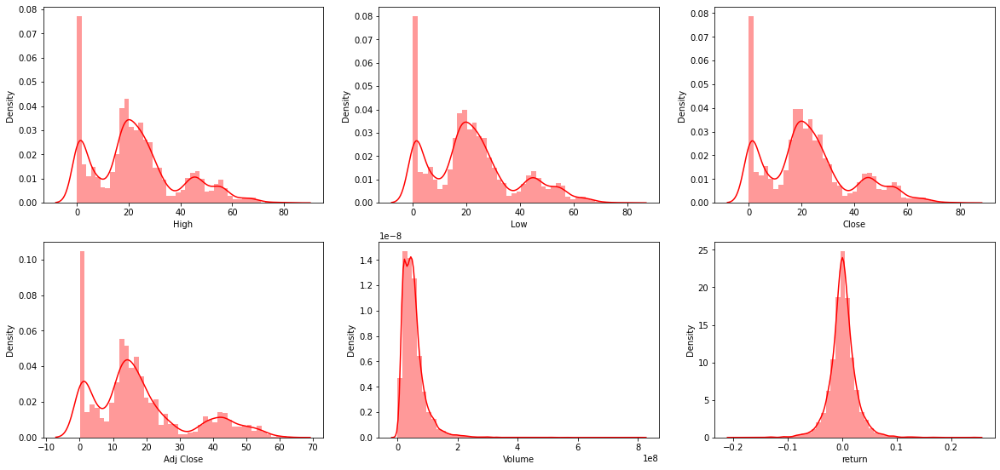

In [25]:
#plot a univariate distribution of continues observations
plt.figure(figsize=(20,60), facecolor='white')
plotnumber =1
for continuous_feature in continuous_features:
    ax = plt.subplot(12,3,plotnumber)
    sns.distplot(cisco[continuous_feature],color='red')
    plt.xlabel(continuous_feature)
    plotnumber+=1
plt.show()

c:\Users\Ashutosh Nayak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

c:\Users\Ashutosh Nayak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

c:\Users\Ashutosh Nayak\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

c:\Users\Ashutosh Nayak\anaconda3\lib\site-packag

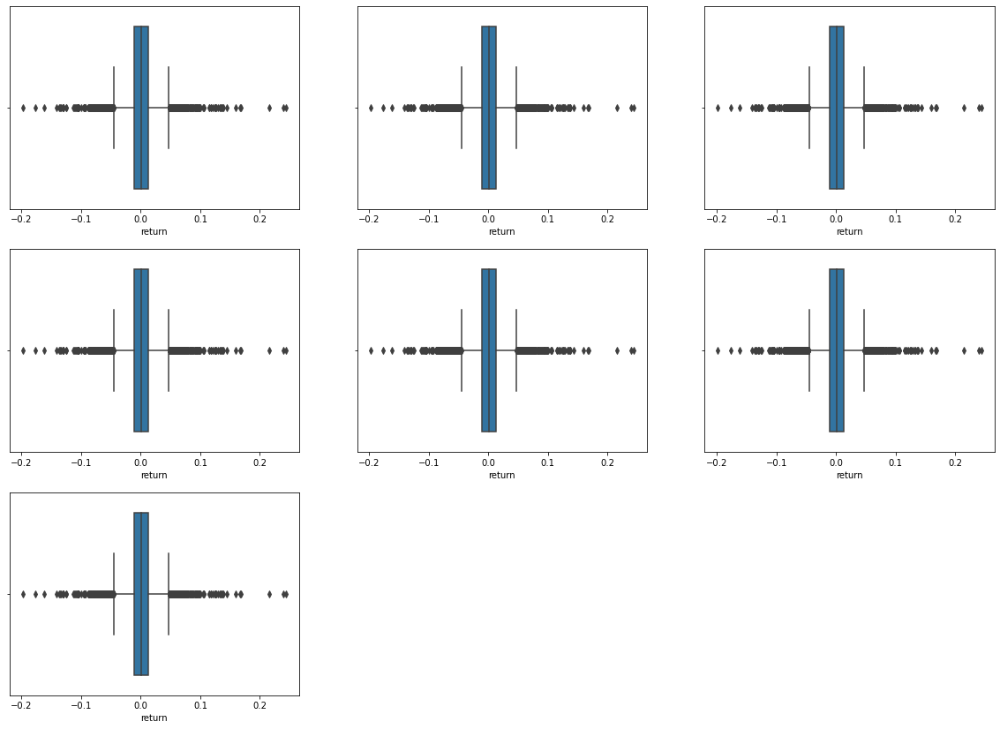

In [26]:
plt.figure(figsize=(20,60), facecolor='white')
plotnumber =1
for numerical_feature in numerical_features:
    ax = plt.subplot(12,3,plotnumber)
    sns.boxplot(cisco[continuous_feature])
    plt.xlabel(continuous_feature)
    plotnumber+=1
plt.show()

# Displaying co-relation between close and adjusted close

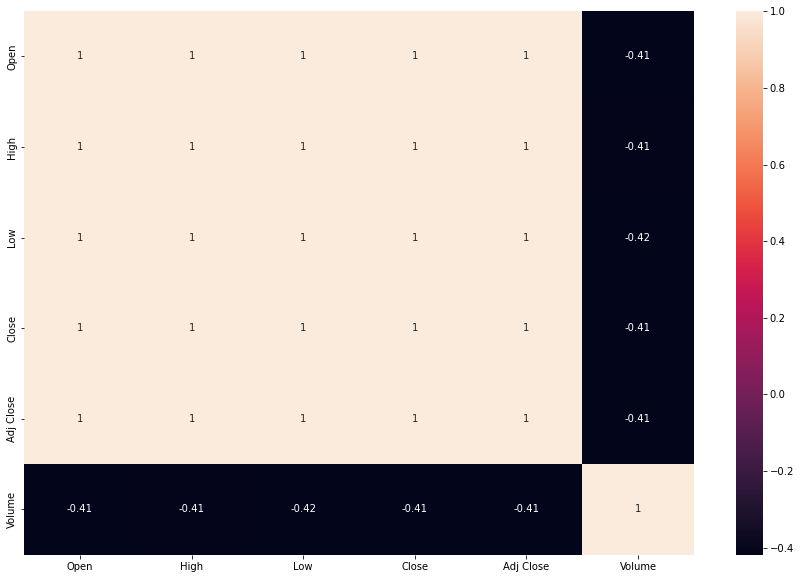

In [27]:
cor_mat=facebook.corr()
fig = plt.figure(figsize=(15,10))
sns.heatmap(cor_mat,annot=True)
plt.show()

In [28]:
print (cor_mat['Close'].sort_values(ascending=False), '\n')

Close        1.000000
Adj Close    1.000000
Low          0.999752
High         0.999728
Open         0.999454
Volume      -0.413578
Name: Close, dtype: float64 



# Data preprocessing

In [29]:
data_preprocessed = facebook.copy()

In [30]:
data_preprocessed.isnull().mean() * 100

Date         0.0
Open         0.0
High         0.0
Low          0.0
Close        0.0
Adj Close    0.0
Volume       0.0
dtype: float64

In [31]:
data_preprocessed['Date'] = pd.to_datetime(data_preprocessed['Date'])

In [32]:
date_columns = ['Date']
num_columns = data_preprocessed.select_dtypes(include=['float64', 'int64']).columns
target_col = 'Close'

In [33]:
num_columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [34]:
data_preprocessed.reset_index(drop=True, inplace=True)

# Splitting of Train and Test Data

In [35]:
X = cisco.drop(['Date','Open'],axis=1)
Y = cisco['Open']

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state=42)

In [36]:
len(X_train)


6607

<AxesSubplot:>

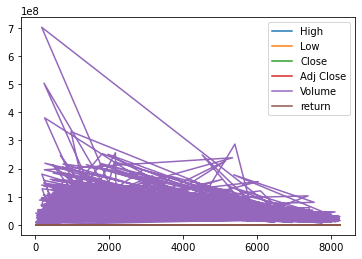

In [37]:
len(X_test)
X_test.plot()

In [38]:
X.head()

,High,Low,Close,Adj Close,Volume,return
0,0.081597,0.079861,0.079861,0.056712,28425600,0.001099
1,0.081597,0.079861,0.080729,0.057328,8438400,0.010869
2,0.081597,0.079861,0.079861,0.056712,2419200,-0.010752
3,0.081597,0.078993,0.079861,0.056712,23904000,0.000000
4,0.079861,0.077257,0.078125,0.055479,18172800,-0.021738


In [39]:
Y.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Open, dtype: float64

<AxesSubplot:>

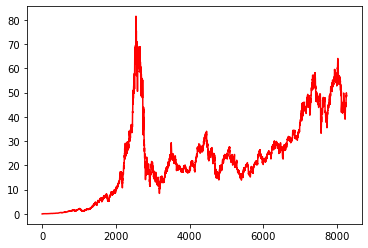

In [40]:
Y.plot(color='r')

<AxesSubplot:>

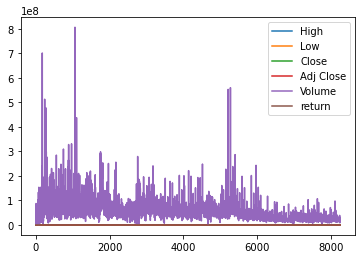

In [41]:
X.plot()

# Normalisation using MinMax

In [42]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0,1))
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


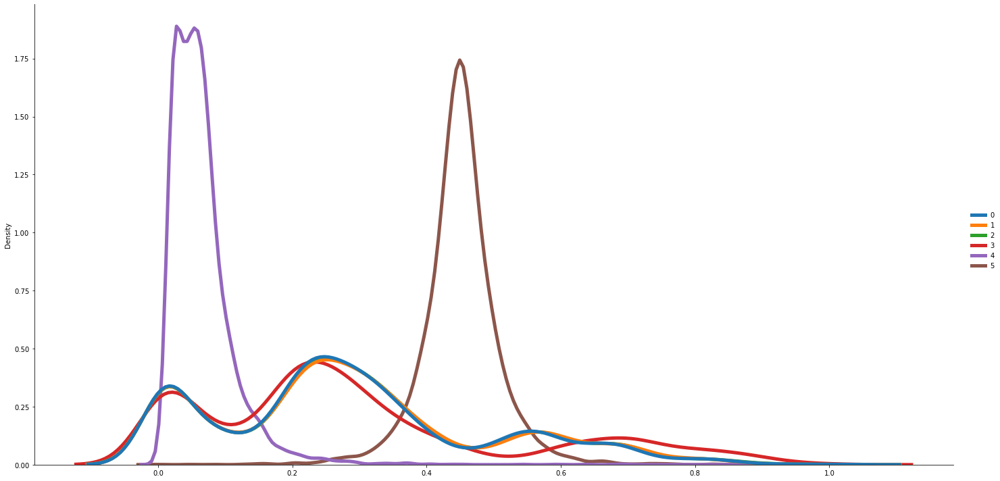

In [43]:
ax = sns.displot(X_train_scaled, kind = "kde",color = "#e64e4e", height=10, aspect=2,
            linewidth = 5 )

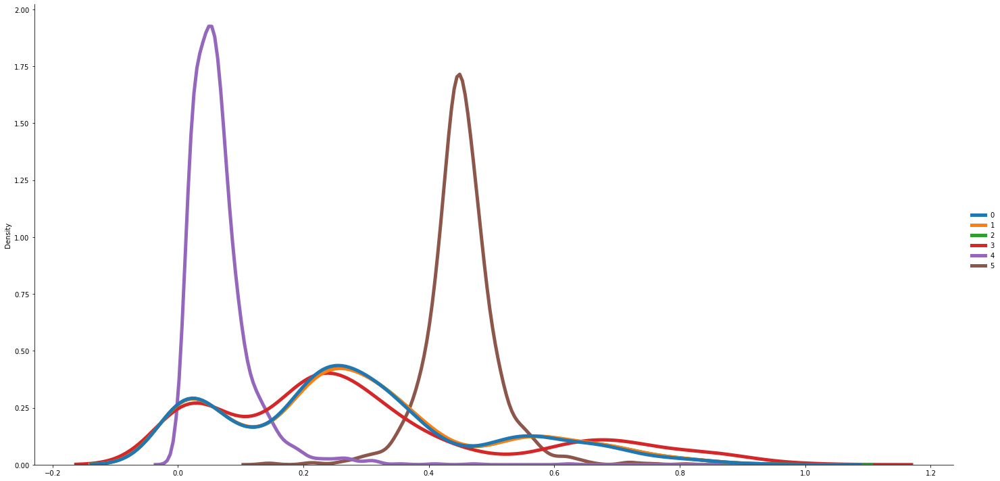

In [44]:
ax = sns.displot(X_test_scaled, kind = "kde",color = "#e64e4e", height=10, aspect=2,
            linewidth = 5 )

In [45]:
from sklearn.feature_selection import SelectKBest, f_regression
fs = SelectKBest(k=3)
X_train_scaled = fs.fit_transform(X_train_scaled, y_train)
X_test_scaled = fs.transform(X_test_scaled)


In [46]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import HuberRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor

In [47]:
lr = LinearRegression().fit(X_train_scaled, y_train)
y_lr = lr.predict(X_test_scaled)

In [48]:
knn = KNeighborsRegressor(n_neighbors=3).fit(X_train_scaled, y_train)
y_knn = knn.predict(X_test_scaled)

In [49]:
dt = DecisionTreeRegressor().fit(X_train_scaled, y_train)
y_dt = dt.predict(X_test_scaled)

In [50]:
br = BayesianRidge().fit(X_train_scaled,y_train)
y_br = br.predict(X_test_scaled)

In [51]:
en = ElasticNet().fit(X_train_scaled,y_train)
y_en = en.predict(X_test_scaled)

In [52]:
gb = GradientBoostingRegressor().fit(X_train_scaled,y_train)
y_gb = gb.predict(X_test_scaled)

In [53]:
hr = HuberRegressor(max_iter=200).fit(X_train_scaled,y_train)
y_hr = hr.predict(X_test_scaled)

In [54]:
svr = SVR().fit(X_train_scaled,y_train)
y_svr = svr.predict(X_test_scaled)

In [55]:
rf = RandomForestRegressor().fit(X_train_scaled,y_train)
y_rf = rf.predict(X_test_scaled)

In [56]:
et = ExtraTreesRegressor().fit(X_train_scaled,y_train)
y_et = et.predict(X_test_scaled)

In [57]:
lr_score = metrics.r2_score(y_test, y_lr)
knn_score = metrics.r2_score(y_test, y_knn)
dt_score = metrics.r2_score(y_test, y_dt)
br_score = metrics.r2_score(y_test, y_br)
en_score = metrics.r2_score(y_test, y_en)
gb_score = metrics.r2_score(y_test, y_gb)
hr_score = metrics.r2_score(y_test, y_hr)
svr_score = metrics.r2_score(y_test, y_svr)
rf_score = metrics.r2_score(y_test, y_rf)
et_score = metrics.r2_score(y_test, y_et)


In [58]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
print("*"*20, "R2 Score", "*"*20)
print("-"*50)
print("| Linear Regression: ", lr_score)
print("-"*50)
print("-"*50)
print("| KNearest Neighbors: ", knn_score)
print("-"*50)
print("-"*50)
print("| Decision Tree: ", dt_score)
print("-"*50)
print("-"*50)
print("| Bayesian Ridge: ", br_score)
print("-"*50)
print("-"*50)
print("| Elastic Net: ", en_score)
print("-"*50)
print("-"*50)
print("| Gradient Boosting: ", gb_score)
print("-"*50)
print("-"*50)
print("| Huber: ", hr_score)
print("-"*50)
print("-"*50)
print("| Support Vector Regression: ", svr_score)
print("-"*50)
print("-"*50)
print("| Random Forest:", rf_score)
print("-"*50)
print("-"*50)
print("| Extra Tree: ", et_score)
print("-"*50)


******************** R2 Score ********************
--------------------------------------------------
| Linear Regression:  0.9997891741506723
--------------------------------------------------
--------------------------------------------------
| KNearest Neighbors:  0.9996875793340628
--------------------------------------------------
--------------------------------------------------
| Decision Tree:  0.9993813622452619
--------------------------------------------------
--------------------------------------------------
| Bayesian Ridge:  0.9997891803401087
--------------------------------------------------
--------------------------------------------------
| Elastic Net:  0.308957386638951
--------------------------------------------------
--------------------------------------------------
| Gradient Boosting:  0.9995922852286796
--------------------------------------------------
--------------------------------------------------
| Huber:  0.9997878338985366
------------------------

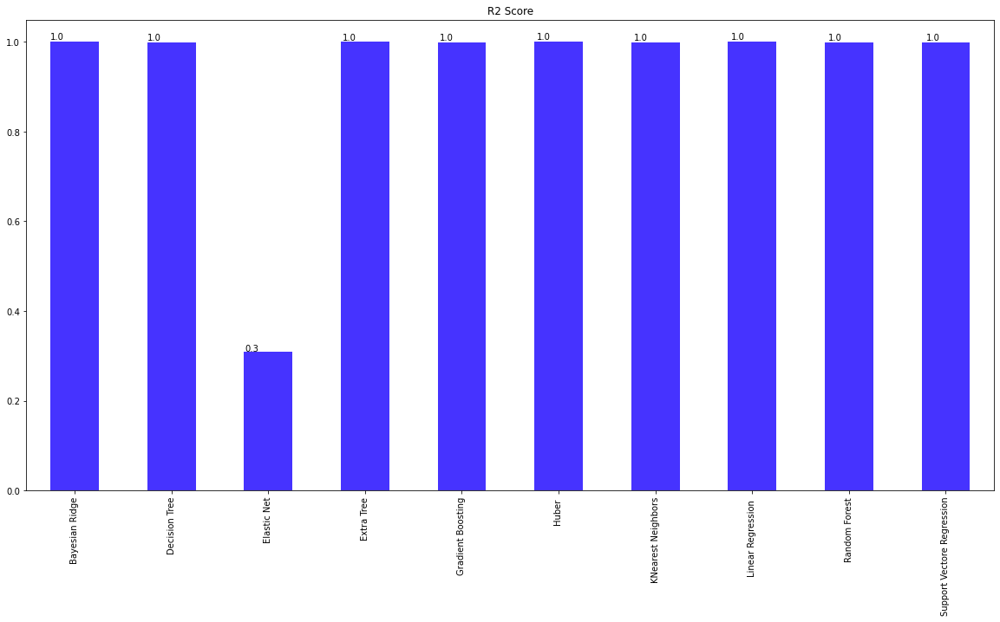

In [59]:
metric_val = {
 "R2 score": {
 "Linear Regression ": lr_score,
 "KNearest Neighbors": knn_score,
 "Decision Tree": dt_score,
 "Bayesian Ridge": br_score,
 "Elastic Net": en_score,
 "Gradient Boosting": gb_score,
 "Huber ": hr_score,
 "Support Vectore Regression": svr_score,
 "Random Forest": rf_score,
 "Extra Tree": et_score
 }
}
ax = pd.DataFrame(metric_val).plot(kind="bar", 
                             figsize = (20,10), 
                             legend =False, 
                             title = "R2 Score",
                             color = '#4633FF');
 
for p in ax.patches:
    ax.annotate(str(round(p.get_height(), 1)), (p.get_x() * 1.005, p.get_height() * 1.005))

In [60]:
lr_score_MSE = metrics.mean_squared_error(y_test, y_lr)
knn_score_MSE = metrics.mean_squared_error(y_test, y_knn)
dt_score_MSE = metrics.mean_squared_error(y_test, y_dt)
br_score_MSE = metrics.mean_squared_error(y_test, y_br)
en_score_MSE = metrics.mean_squared_error(y_test, y_en)
gb_score_MSE = metrics.mean_squared_error(y_test, y_gb)
hr_score_MSE = metrics.mean_squared_error(y_test, y_hr)
svr_score_MSE = metrics.mean_squared_error(y_test, y_svr)
rf_score_MSE = metrics.mean_squared_error(y_test, y_rf)
et_score_MSE = metrics.mean_squared_error(y_test, y_et)

In [61]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("*"*20, "Mean Squared Error", "*"*20)

print("-"*50)
print("| Linear Regression: ", lr_score_MSE)
print("-"*50)

print("-"*50)
print("| KNearest Neighbors: ", knn_score_MSE)
print("-"*50)

print("-"*50)
print("| Decision Tree: ", dt_score_MSE)
print("-"*50)

print("-"*50)
print("| Bayesian Ridge: ", br_score_MSE)
print("-"*50)

print("-"*50)
print("| Elastic Net: ", en_score_MSE)
print("-"*50)

print("-"*50)
print("| Gradient Boosting: ", gb_score_MSE)
print("-"*50)

print("-"*50)
print("| Huber: ", hr_score_MSE)
print("-"*50)

print("-"*50)
print("| Support Vector Regression: ", svr_score_MSE)
print("-"*50)

print("-"*50)
print("| Random Forest: ", rf_score_MSE)
print("-"*50)

print("-"*50)
print("| Extra Tree: ", et_score_MSE)
print("-"*50)

******************** Mean Squared Error ********************
--------------------------------------------------
| Linear Regression:  0.05692284742319233
--------------------------------------------------
--------------------------------------------------
| KNearest Neighbors:  0.08435338434872018
--------------------------------------------------
--------------------------------------------------
| Decision Tree:  0.1670318067517246
--------------------------------------------------
--------------------------------------------------
| Bayesian Ridge:  0.056921176279231774
--------------------------------------------------
--------------------------------------------------
| Elastic Net:  186.58107328250935
--------------------------------------------------
--------------------------------------------------
| Gradient Boosting:  0.11008273318499999
--------------------------------------------------
--------------------------------------------------
| Huber:  0.05728471466132217
-------

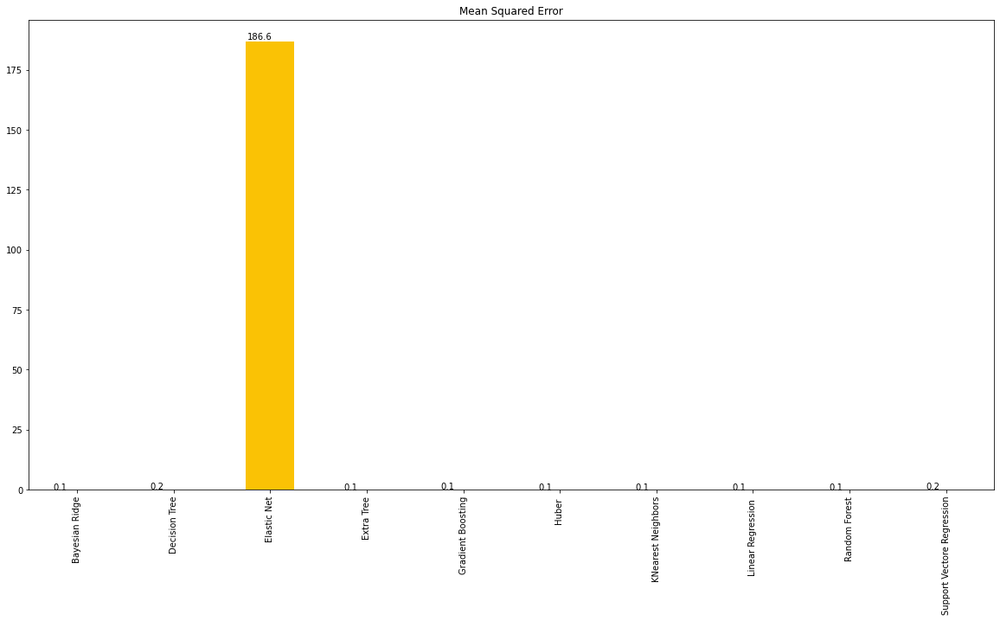

In [62]:
metric_val = {
    "Mean Squared Error": {
    "Linear Regression ": lr_score_MSE,
    "KNearest Neighbors": knn_score_MSE,
    "Decision Tree": dt_score_MSE,
    "Bayesian Ridge": br_score_MSE,
    "Elastic Net": en_score_MSE,
    "Gradient Boosting": gb_score_MSE,
    "Huber ": hr_score_MSE,
    "Support Vectore Regression": svr_score_MSE,
    "Random Forest": rf_score_MSE,
    "Extra Tree": et_score_MSE
    }
}

ax = pd.DataFrame(metric_val).plot(kind="bar", 
                             figsize = (20,10), 
                             legend =False, 
                             title = "Mean Squared Error",
                             color = '#FAC205');
                    
for p in ax.patches:
    ax.annotate(str(round(p.get_height(), 1)), (p.get_x() * 1.005, p.get_height() * 1.005))

In [63]:
lr_score_MAE = metrics.mean_absolute_error(y_test, y_lr)
knn_score_MAE = metrics.mean_absolute_error(y_test, y_knn)
dt_score_MAE = metrics.mean_absolute_error(y_test, y_dt)
br_score_MAE = metrics.mean_absolute_error(y_test, y_br)
en_score_MAE = metrics.mean_absolute_error(y_test, y_en)
gb_score_MAE = metrics.mean_absolute_error(y_test, y_gb)
hr_score_MAE = metrics.mean_absolute_error(y_test, y_hr)
svr_score_MAE = metrics.mean_absolute_error(y_test, y_svr)
rf_score_MAE = metrics.mean_absolute_error(y_test, y_rf)
et_score_MAE = metrics.mean_absolute_error(y_test, y_et)

In [64]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("*"*20, "Mean Squared Error", "*"*20)

print("-"*50)
print("| Linear Regression: ", lr_score_MAE)
print("-"*50)

print("-"*50)
print("| KNearest Neighbors: ", knn_score_MAE)
print("-"*50)

print("-"*50)
print("| Decision Tree: ", dt_score_MAE)
print("-"*50)

print("-"*50)
print("| Bayesian Ridge: ", br_score_MAE)
print("-"*50)

print("-"*50)
print("| Elastic Net: ", en_score_MAE)
print("-"*50)

print("-"*50)
print("| Gradient Boosting: ", gb_score_MAE)
print("-"*50)

print("-"*50)
print("| Huber: ", hr_score_MSE)
print("-"*50)

print("-"*50)
print("| Support Vector Regression: ", svr_score_MAE)
print("-"*50)

print("-"*50)
print("| Random Forest: ", rf_score_MAE)
print("-"*50)

print("-"*50)
print("| Extra Tree: ", et_score_MAE)
print("-"*50)

******************** Mean Squared Error ********************
--------------------------------------------------
| Linear Regression:  0.13395468041643524
--------------------------------------------------
--------------------------------------------------
| KNearest Neighbors:  0.15976657808716704
--------------------------------------------------
--------------------------------------------------
| Decision Tree:  0.20579374394673122
--------------------------------------------------
--------------------------------------------------
| Bayesian Ridge:  0.1339559479680318
--------------------------------------------------
--------------------------------------------------
| Elastic Net:  10.612226460898244
--------------------------------------------------
--------------------------------------------------
| Gradient Boosting:  0.20581371927978664
--------------------------------------------------
--------------------------------------------------
| Huber:  0.05728471466132217
--------

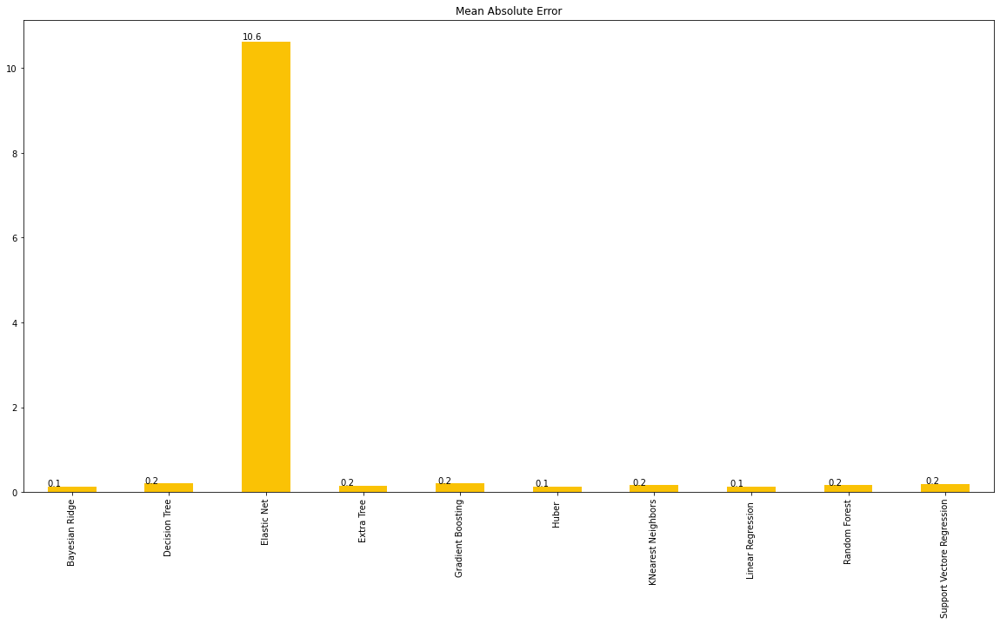

In [65]:
metric_val = {
    "Mean Absolute Error": {
    "Linear Regression ": lr_score_MAE,
    "KNearest Neighbors": knn_score_MAE,
    "Decision Tree": dt_score_MAE,
    "Bayesian Ridge": br_score_MAE,
    "Elastic Net": en_score_MAE,
    "Gradient Boosting": gb_score_MAE,
    "Huber ": hr_score_MAE,
    "Support Vectore Regression": svr_score_MAE,
    "Random Forest": rf_score_MAE,
    "Extra Tree": et_score_MAE
    }
}

ax = pd.DataFrame(metric_val).plot(kind="bar", 
                             figsize = (20,10), 
                             legend =False, 
                             title = "Mean Absolute Error",
                             color = '#FAC205');
                    
for p in ax.patches:
    ax.annotate(str(round(p.get_height(), 1)), (p.get_x() * 1.005, p.get_height() * 1.005))

# SVR

In [66]:
y_svr 

array([26.24358501, 23.28125005,  0.31601324, ...,  8.46316883,
        1.00600236, 17.87185663])

In [67]:
y_test

5905    26.410000
5209    23.430000
291      0.222222
2910    14.540000
2441    33.875000
          ...    
5620    16.969999
4058    21.530001
1862     8.440972
701      1.041667
4819    17.799999
Name: Open, Length: 1652, dtype: float64

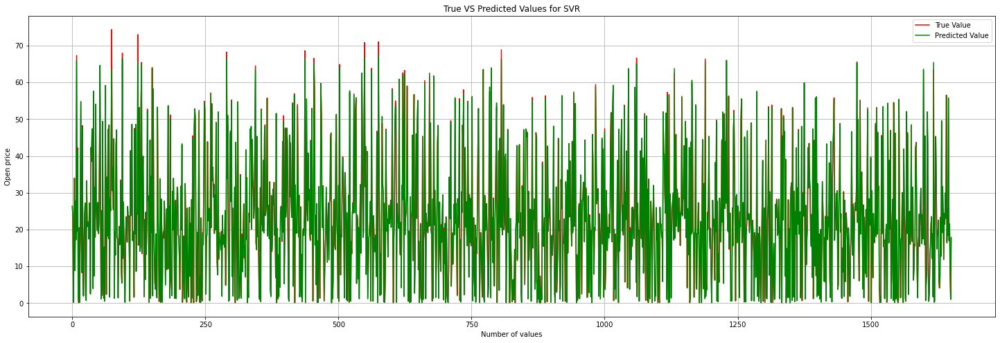

In [68]:
# plot prediction VS original data
y_test = list(y_test)
plt.figure(figsize=(25, 8))
plt.plot(y_test, color = 'r', label = 'True Value')
plt.plot(y_svr, color = 'g', label = 'Predicted Value')
plt.legend()
plt.xlabel('Values')
plt.ylabel('Open price')
plt.title('True VS Predicted Values for SVR')

plt.xlabel('Number of values')


plt.grid()
plt.show();

<AxesSubplot:>

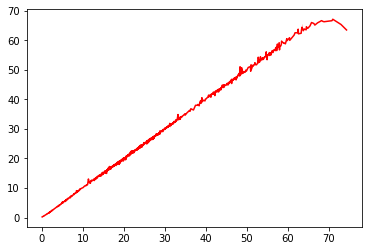

In [69]:
sns.lineplot(x=y_test,y=y_svr,color='red')

In [70]:
print ("The Accuracy of SVR model is :", svr_score*100,"%")

The Accuracy of SVR model is : 99.92194502546997 %


# KNN

In [71]:
y_knn

array([26.22000067, 23.44333267,  0.21759267, ...,  8.43981467,
        1.037037  , 18.05666667])

In [72]:
y_test

[26.41,
 23.43,
 0.222222,
 14.54,
 33.875,
 8.847222,
 27.65,
 17.209999,
 67.3125,
 19.540001,
 42.21875,
 2.006944,
 0.078125,
 20.5,
 0.230903,
 28.76,
 54.799999,
 17.200001,
 8.291667,
 48.25,
 3.527778,
 2.041667,
 16.875,
 23.76,
 27.265625,
 2.222222,
 0.756944,
 33.259998,
 20.950001,
 22.0,
 22.040001,
 17.530001,
 27.209999,
 21.9,
 2.666667,
 42.139999,
 38.48,
 47.43,
 47.139999,
 4.055556,
 57.580002,
 7.402778,
 31.35,
 18.290001,
 53.91,
 27.17,
 22.450001,
 20.219999,
 27.25,
 18.879999,
 21.92,
 41.25,
 64.5625,
 27.1875,
 1.21875,
 25.17,
 2.236111,
 49.349998,
 5.666667,
 1.395833,
 14.95,
 0.527778,
 59.099998,
 26.02,
 2.444444,
 34.290001,
 18.24,
 47.119999,
 17.49,
 48.330002,
 1.75,
 27.9,
 25.1,
 46.119999,
 74.359375,
 30.51,
 36.360001,
 25.875,
 44.419998,
 1.381944,
 19.43,
 13.15,
 42.810001,
 46.84,
 18.200001,
 17.360001,
 1.506944,
 14.94,
 20.9,
 15.85,
 17.15,
 33.490002,
 8.597222,
 5.597222,
 67.9375,
 12.11,
 27.559999,
 16.83,
 6.805556,
 0.203

Text(0.5, 1.0, 'True VS Predicted Values for KNN')

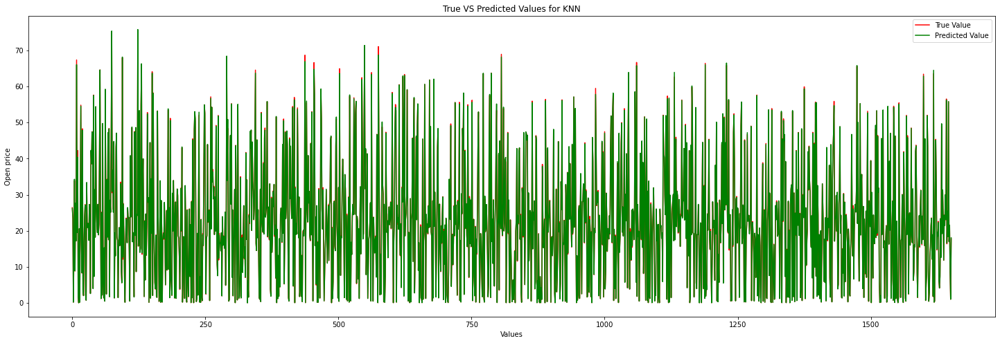

In [73]:
# plot prediction VS original data
y_test = list(y_test)
plt.figure(figsize=(25, 8))
plt.plot(y_test, color = 'r', label = 'True Value')
plt.plot(y_knn, color = 'g', label = 'Predicted Value')

plt.legend()
plt.xlabel('Values')
plt.ylabel('Open price')
plt.title('True VS Predicted Values for KNN')

<AxesSubplot:>

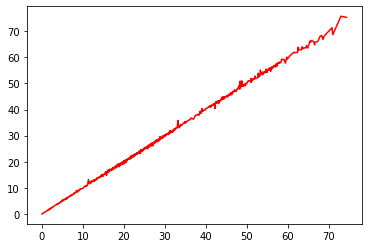

In [74]:
sns.lineplot(x=y_test,y=y_knn,color='red')

In [75]:
print ("The Accuracy of KNN model is :", knn_score*100,"%")

The Accuracy of KNN model is : 99.96875793340628 %


# RANDOM FOREST

In [76]:
y_rf


array([26.26700078, 23.37228724,  0.21862847, ...,  8.34465277,
        1.03819429, 17.97630005])

In [77]:
y_test

[26.41,
 23.43,
 0.222222,
 14.54,
 33.875,
 8.847222,
 27.65,
 17.209999,
 67.3125,
 19.540001,
 42.21875,
 2.006944,
 0.078125,
 20.5,
 0.230903,
 28.76,
 54.799999,
 17.200001,
 8.291667,
 48.25,
 3.527778,
 2.041667,
 16.875,
 23.76,
 27.265625,
 2.222222,
 0.756944,
 33.259998,
 20.950001,
 22.0,
 22.040001,
 17.530001,
 27.209999,
 21.9,
 2.666667,
 42.139999,
 38.48,
 47.43,
 47.139999,
 4.055556,
 57.580002,
 7.402778,
 31.35,
 18.290001,
 53.91,
 27.17,
 22.450001,
 20.219999,
 27.25,
 18.879999,
 21.92,
 41.25,
 64.5625,
 27.1875,
 1.21875,
 25.17,
 2.236111,
 49.349998,
 5.666667,
 1.395833,
 14.95,
 0.527778,
 59.099998,
 26.02,
 2.444444,
 34.290001,
 18.24,
 47.119999,
 17.49,
 48.330002,
 1.75,
 27.9,
 25.1,
 46.119999,
 74.359375,
 30.51,
 36.360001,
 25.875,
 44.419998,
 1.381944,
 19.43,
 13.15,
 42.810001,
 46.84,
 18.200001,
 17.360001,
 1.506944,
 14.94,
 20.9,
 15.85,
 17.15,
 33.490002,
 8.597222,
 5.597222,
 67.9375,
 12.11,
 27.559999,
 16.83,
 6.805556,
 0.203

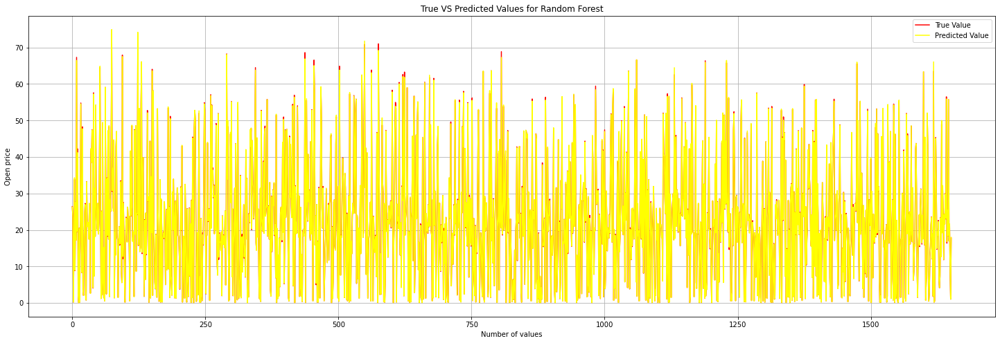

In [78]:
# plot prediction VS original data
y_test = list(y_test)
plt.figure(figsize=(25, 8))
plt.plot(y_test, color = 'red', label = 'True Value')
plt.plot(y_rf, color = 'yellow', label = 'Predicted Value')
plt.legend()
plt.xlabel('Values')
plt.ylabel('Open price')
plt.title('True VS Predicted Values for Random Forest')

plt.xlabel('Number of values')


plt.grid()
plt.show();

<AxesSubplot:>

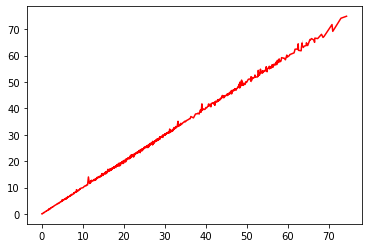

In [79]:
sns.lineplot(x=y_test,y=y_rf,color='red')

In [80]:
print ("The Accuracy of the Random Forest model is :",rf_score*100,"%")

The Accuracy of the Random Forest model is : 99.96911965216168 %


# EXTRA TREE

In [81]:
y_et

array([26.27280074, 23.42032488,  0.21881947, ...,  8.38902775,
        1.03854135, 17.98180002])

In [82]:
y_test

[26.41,
 23.43,
 0.222222,
 14.54,
 33.875,
 8.847222,
 27.65,
 17.209999,
 67.3125,
 19.540001,
 42.21875,
 2.006944,
 0.078125,
 20.5,
 0.230903,
 28.76,
 54.799999,
 17.200001,
 8.291667,
 48.25,
 3.527778,
 2.041667,
 16.875,
 23.76,
 27.265625,
 2.222222,
 0.756944,
 33.259998,
 20.950001,
 22.0,
 22.040001,
 17.530001,
 27.209999,
 21.9,
 2.666667,
 42.139999,
 38.48,
 47.43,
 47.139999,
 4.055556,
 57.580002,
 7.402778,
 31.35,
 18.290001,
 53.91,
 27.17,
 22.450001,
 20.219999,
 27.25,
 18.879999,
 21.92,
 41.25,
 64.5625,
 27.1875,
 1.21875,
 25.17,
 2.236111,
 49.349998,
 5.666667,
 1.395833,
 14.95,
 0.527778,
 59.099998,
 26.02,
 2.444444,
 34.290001,
 18.24,
 47.119999,
 17.49,
 48.330002,
 1.75,
 27.9,
 25.1,
 46.119999,
 74.359375,
 30.51,
 36.360001,
 25.875,
 44.419998,
 1.381944,
 19.43,
 13.15,
 42.810001,
 46.84,
 18.200001,
 17.360001,
 1.506944,
 14.94,
 20.9,
 15.85,
 17.15,
 33.490002,
 8.597222,
 5.597222,
 67.9375,
 12.11,
 27.559999,
 16.83,
 6.805556,
 0.203

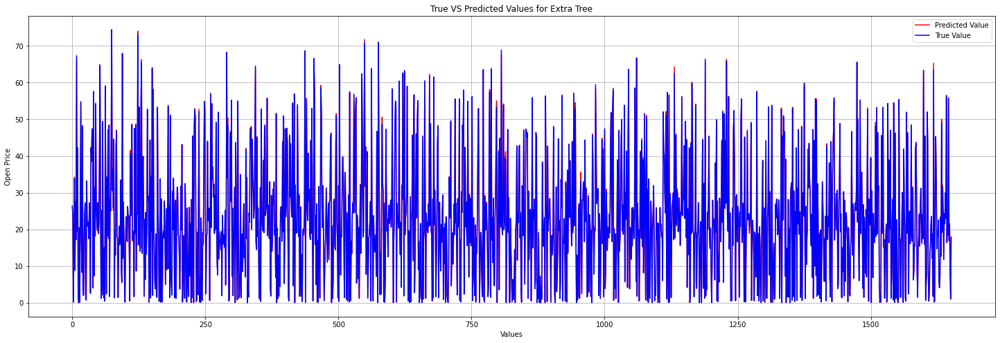

In [83]:
# plot prediction VS original data
y_test = list(y_test)
plt.figure(figsize=(25, 8))
plt.plot(y_et, color = 'red', label = 'Predicted Value')
plt.plot(y_test, color = 'blue', label = 'True Value')
plt.legend()
plt.xlabel('Values')
plt.ylabel('Open Price')
plt.title('True VS Predicted Values for Extra Tree')



plt.grid()
plt.show();

<AxesSubplot:>

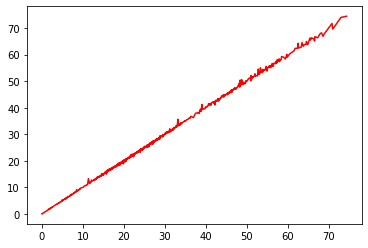

In [84]:

sns.lineplot(x=y_test,y=y_et,color='red')

In [85]:
print ("The Accuracy of Extra Tree model is :",et_score*100,"%")

The Accuracy of Extra Tree model is : 99.97212979853887 %
